# Exploratory Analysis

In [1]:
import pandas as pd
import seaborn as sb
import numpy as np
import matplotlib.pyplot as plt

sb.set()

## Import dataset

In [2]:
df = pd.read_csv('Dataset.csv', index_col=0)
df.head()

,ADI,Age,person_id,Gender,Subgroup,absence_indicator,analytic_period_id,tenure,overtime,salary,...,extreme_heat_ssp585_2045,wildfire_potential_2018,wildfire_potential_2019,wildfire_potential_2019.1,wildfire_potential_ssp245_2025,wildfire_potential_ssp245_2035,wildfire_potential_ssp245_2045,wildfire_potential_ssp585_2025,wildfire_potential_ssp585_2035,wildfire_potential_ssp585_2045
0,28,37,3030515063,Male,Subgroup P,0,1,18.25,1,115700.0,...,13.380953,10.975000,11.460870,12.070652,6.033403,6.347014,6.512159,6.093082,6.504460,6.743331
1,18,34,9786383567,Male,Subgroup P,0,1,3.99,7,81435.0,...,13.380953,11.141304,11.520652,11.871739,6.033403,6.347014,6.512159,6.093082,6.504460,6.743331
2,15,36,5602306401,Male,Subgroup P,0,1,3.05,1,86400.0,...,15.597403,10.393478,10.777174,11.659783,6.064177,6.380910,6.548825,6.117186,6.522880,6.771772
3,36,41,8107765424,Male,Subgroup P,0,1,20.29,1,79176.0,...,12.290043,11.039130,11.023913,11.963043,6.069724,6.365864,6.512409,6.091926,6.469195,6.700504
4,49,51,7879842771,Male,Subgroup P,0,1,13.66,7,94511.0,...,12.290043,10.760870,11.308696,12.006522,6.069724,6.365864,6.512409,6.091926,6.469195,6.700504


In [3]:
print("Data type : ", type(df))
print("Data dims : ", df.shape)

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dims :  (43184, 74)


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 43184 entries, 0 to 43183
Data columns (total 74 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   ADI                                 43184 non-null  int64  
 1   Age                                 43184 non-null  int64  
 2   person_id                           43184 non-null  int64  
 3   Gender                              43184 non-null  object 
 4   Subgroup                            43184 non-null  object 
 5   absence_indicator                   43184 non-null  int64  
 6   analytic_period_id                  43184 non-null  int64  
 7   tenure                              43184 non-null  float64
 8   overtime                            43184 non-null  int64  
 9   salary                              43184 non-null  float64
 10  performance_rating                  43184 non-null  int64  
 11  BiometricScreeningParticipants      43184 non-

In [5]:
data_dtypes = {}
for column in df.columns:
    # print('{}:{}'.format(column, df[column].isna().sum()))
    data_dtypes[column] =  df[column].dtype
    
print(data_dtypes)

{'ADI': dtype('int64'), 'Age': dtype('int64'), 'person_id': dtype('int64'), 'Gender': dtype('O'), 'Subgroup': dtype('O'), 'absence_indicator': dtype('int64'), 'analytic_period_id': dtype('int64'), 'tenure': dtype('float64'), 'overtime': dtype('int64'), 'salary': dtype('float64'), 'performance_rating': dtype('int64'), 'BiometricScreeningParticipants': dtype('int64'), 'HRQParticipants': dtype('int64'), 'lsbio_cholesterol': dtype('int64'), 'lsbio_glucose': dtype('int64'), 'lsbio_bp': dtype('int64'), 'lsbio_weight': dtype('int64'), 'lsbio_trig': dtype('int64'), 'lshrq_physact': dtype('int64'), 'lshrq_tobacco': dtype('int64'), 'lshrq_nutrition': dtype('int64'), 'lshrq_stress': dtype('int64'), 'lshrq_genHealth': dtype('int64'), 'lshrq_wellbeing': dtype('int64'), 'lshrq_alcohol': dtype('int64'), 'lshrq_sleeping': dtype('int64'), 'cc_RespiratorySinusAllergy_chronic': dtype('int64'), 'cc_diabetes': dtype('int64'), 'cc_cancer': dtype('int64'), 'cc_mskChronic': dtype('int64'), 'cc_cholesterol': d

## Data Cleaning

In [6]:
# check for discrepancies in the biometric screening participants and HRQ participants and whether they have any results

df_wrong_0 = df.loc[(df.BiometricScreeningParticipants == 0) & ((df.lsbio_bp == 1)|(df.lsbio_cholesterol ==1)|(df.lsbio_glucose==1)|(df.lsbio_trig==1)|df.lsbio_weight==1)]
df_wrong_0.head()

,ADI,Age,person_id,Gender,Subgroup,absence_indicator,analytic_period_id,tenure,overtime,salary,...,extreme_heat_ssp585_2045,wildfire_potential_2018,wildfire_potential_2019,wildfire_potential_2019.1,wildfire_potential_ssp245_2025,wildfire_potential_ssp245_2035,wildfire_potential_ssp245_2045,wildfire_potential_ssp585_2025,wildfire_potential_ssp585_2035,wildfire_potential_ssp585_2045


There are no discrepancies when it comes to biometric screening

In [7]:
df_wrong_0 = df.loc[(df.HRQParticipants == 0) & ((df.lshrq_alcohol == 1)|(df.lshrq_genHealth ==1)|(df.lshrq_nutrition==1)|(df.lshrq_physact==1)|(df.lshrq_sleeping==1)|(df.lshrq_stress==1)|(df.lshrq_tobacco==1)|(df.lshrq_wellbeing==1))]
df_wrong_0.head()

,ADI,Age,person_id,Gender,Subgroup,absence_indicator,analytic_period_id,tenure,overtime,salary,...,extreme_heat_ssp585_2045,wildfire_potential_2018,wildfire_potential_2019,wildfire_potential_2019.1,wildfire_potential_ssp245_2025,wildfire_potential_ssp245_2035,wildfire_potential_ssp245_2045,wildfire_potential_ssp585_2025,wildfire_potential_ssp585_2035,wildfire_potential_ssp585_2045


There are no discrepanceis when it comes to health risk questionnaire

In [8]:
# check for na values

data_na = {}
for column in df.columns:
    # print('{}:{}'.format(column, df[column].isna().sum()))
    data_na[column] =  df[column].isna().sum()
    
print(data_na)

{'ADI': 0, 'Age': 0, 'person_id': 0, 'Gender': 0, 'Subgroup': 0, 'absence_indicator': 0, 'analytic_period_id': 0, 'tenure': 0, 'overtime': 0, 'salary': 0, 'performance_rating': 0, 'BiometricScreeningParticipants': 0, 'HRQParticipants': 0, 'lsbio_cholesterol': 0, 'lsbio_glucose': 0, 'lsbio_bp': 0, 'lsbio_weight': 0, 'lsbio_trig': 0, 'lshrq_physact': 0, 'lshrq_tobacco': 0, 'lshrq_nutrition': 0, 'lshrq_stress': 0, 'lshrq_genHealth': 0, 'lshrq_wellbeing': 0, 'lshrq_alcohol': 0, 'lshrq_sleeping': 0, 'cc_RespiratorySinusAllergy_chronic': 0, 'cc_diabetes': 0, 'cc_cancer': 0, 'cc_mskChronic': 0, 'cc_cholesterol': 0, 'cc_cardiac': 0, 'cc_depression': 0, 'cc_obesity': 0, 'cc_mskAllOther': 0, 'cc_behavioralAllOther': 0, 'cc_ckd': 0, 'concurrent_risk': 0, 'rx_nonClaimant': 0, 'rx_nonCompliant': 0, 'prog_1': 0, 'prog_2': 0, 'prog_3': 0, 'prog_4': 0, 'prog_5': 0, 'prog_6': 0, 'prog_7': 0, 'prog_8': 0, 'prog_9': 0, 'prog_10': 0, 'prog_11': 0, 'prog_12': 0, 'prog_13': 0, 'prog_14': 0, 'prog_15': 0, 'p

There are no na values

In [9]:
# change the values of some rows for better understanding

df.Subgroup = np.where(df.Subgroup == 'Subgroup P', 'Outdoor', 'Indoor')
df.analytic_period_id = np.where(df.analytic_period_id==1, 2018, np.where(df.analytic_period_id==2,2019,2020))
df.head()

,ADI,Age,person_id,Gender,Subgroup,absence_indicator,analytic_period_id,tenure,overtime,salary,...,extreme_heat_ssp585_2045,wildfire_potential_2018,wildfire_potential_2019,wildfire_potential_2019.1,wildfire_potential_ssp245_2025,wildfire_potential_ssp245_2035,wildfire_potential_ssp245_2045,wildfire_potential_ssp585_2025,wildfire_potential_ssp585_2035,wildfire_potential_ssp585_2045
0,28,37,3030515063,Male,Outdoor,0,2018,18.25,1,115700.0,...,13.380953,10.975000,11.460870,12.070652,6.033403,6.347014,6.512159,6.093082,6.504460,6.743331
1,18,34,9786383567,Male,Outdoor,0,2018,3.99,7,81435.0,...,13.380953,11.141304,11.520652,11.871739,6.033403,6.347014,6.512159,6.093082,6.504460,6.743331
2,15,36,5602306401,Male,Outdoor,0,2018,3.05,1,86400.0,...,15.597403,10.393478,10.777174,11.659783,6.064177,6.380910,6.548825,6.117186,6.522880,6.771772
3,36,41,8107765424,Male,Outdoor,0,2018,20.29,1,79176.0,...,12.290043,11.039130,11.023913,11.963043,6.069724,6.365864,6.512409,6.091926,6.469195,6.700504
4,49,51,7879842771,Male,Outdoor,0,2018,13.66,7,94511.0,...,12.290043,10.760870,11.308696,12.006522,6.069724,6.365864,6.512409,6.091926,6.469195,6.700504


In [10]:
# remove redundant columns

df = df.drop(columns=['person_id'])
df.head()

,ADI,Age,Gender,Subgroup,absence_indicator,analytic_period_id,tenure,overtime,salary,performance_rating,...,extreme_heat_ssp585_2045,wildfire_potential_2018,wildfire_potential_2019,wildfire_potential_2019.1,wildfire_potential_ssp245_2025,wildfire_potential_ssp245_2035,wildfire_potential_ssp245_2045,wildfire_potential_ssp585_2025,wildfire_potential_ssp585_2035,wildfire_potential_ssp585_2045
0,28,37,Male,Outdoor,0,2018,18.25,1,115700.0,3,...,13.380953,10.975000,11.460870,12.070652,6.033403,6.347014,6.512159,6.093082,6.504460,6.743331
1,18,34,Male,Outdoor,0,2018,3.99,7,81435.0,3,...,13.380953,11.141304,11.520652,11.871739,6.033403,6.347014,6.512159,6.093082,6.504460,6.743331
2,15,36,Male,Outdoor,0,2018,3.05,1,86400.0,3,...,15.597403,10.393478,10.777174,11.659783,6.064177,6.380910,6.548825,6.117186,6.522880,6.771772
3,36,41,Male,Outdoor,0,2018,20.29,1,79176.0,3,...,12.290043,11.039130,11.023913,11.963043,6.069724,6.365864,6.512409,6.091926,6.469195,6.700504
4,49,51,Male,Outdoor,0,2018,13.66,7,94511.0,3,...,12.290043,10.760870,11.308696,12.006522,6.069724,6.365864,6.512409,6.091926,6.469195,6.700504


In [11]:
# one hot encoding for Gender and Subgroup

df = pd.get_dummies(df, columns=['Gender'], prefix='Gender')
df = pd.get_dummies(df, columns=['Subgroup'], prefix='Subgroup')
df['Gender_Male'] = df['Gender_Male'].astype(int)
df['Gender_Female'] = df['Gender_Female'].astype(int)
df['Subgroup_Outdoor'] = df['Subgroup_Outdoor'].astype(int)
df['Subgroup_Indoor'] = df['Subgroup_Indoor'].astype(int)

df.head()

,ADI,Age,absence_indicator,analytic_period_id,tenure,overtime,salary,performance_rating,BiometricScreeningParticipants,HRQParticipants,...,wildfire_potential_ssp245_2025,wildfire_potential_ssp245_2035,wildfire_potential_ssp245_2045,wildfire_potential_ssp585_2025,wildfire_potential_ssp585_2035,wildfire_potential_ssp585_2045,Gender_Female,Gender_Male,Subgroup_Indoor,Subgroup_Outdoor
0,28,37,0,2018,18.25,1,115700.0,3,0,0,...,6.033403,6.347014,6.512159,6.093082,6.504460,6.743331,0,1,0,1
1,18,34,0,2018,3.99,7,81435.0,3,1,1,...,6.033403,6.347014,6.512159,6.093082,6.504460,6.743331,0,1,0,1
2,15,36,0,2018,3.05,1,86400.0,3,1,0,...,6.064177,6.380910,6.548825,6.117186,6.522880,6.771772,0,1,0,1
3,36,41,0,2018,20.29,1,79176.0,3,0,0,...,6.069724,6.365864,6.512409,6.091926,6.469195,6.700504,0,1,0,1
4,49,51,0,2018,13.66,7,94511.0,3,1,0,...,6.069724,6.365864,6.512409,6.091926,6.469195,6.700504,0,1,0,1


In [12]:
df_2018 = df.loc[(df.analytic_period_id==2018)]
df_2019 = df.loc[(df.analytic_period_id==2019)]
df_2020 = df.loc[(df.analytic_period_id==2020)]

## 2018

In [13]:
# remove analytic_period_id column

df_2018 = df_2018.drop(columns=['analytic_period_id'])
df_2018.head()

,ADI,Age,absence_indicator,tenure,overtime,salary,performance_rating,BiometricScreeningParticipants,HRQParticipants,lsbio_cholesterol,...,wildfire_potential_ssp245_2025,wildfire_potential_ssp245_2035,wildfire_potential_ssp245_2045,wildfire_potential_ssp585_2025,wildfire_potential_ssp585_2035,wildfire_potential_ssp585_2045,Gender_Female,Gender_Male,Subgroup_Indoor,Subgroup_Outdoor
0,28,37,0,18.25,1,115700.0,3,0,0,0,...,6.033403,6.347014,6.512159,6.093082,6.504460,6.743331,0,1,0,1
1,18,34,0,3.99,7,81435.0,3,1,1,1,...,6.033403,6.347014,6.512159,6.093082,6.504460,6.743331,0,1,0,1
2,15,36,0,3.05,1,86400.0,3,1,0,0,...,6.064177,6.380910,6.548825,6.117186,6.522880,6.771772,0,1,0,1
3,36,41,0,20.29,1,79176.0,3,0,0,0,...,6.069724,6.365864,6.512409,6.091926,6.469195,6.700504,0,1,0,1
4,49,51,0,13.66,7,94511.0,3,1,0,1,...,6.069724,6.365864,6.512409,6.091926,6.469195,6.700504,0,1,0,1


### Uni-Variate Analysis (continuous variables)

In [14]:
# most columns have 2 or 3, at most 6 unique values as they are categorical columns

numeric_data = []

for column in df_2018.columns:
    if len(df_2018[column].unique()) > 6:
        print("Number of unique {} : {}".format(column, len(df_2018[column].unique())))
        numeric_data.append(column)
        
print(numeric_data)

Number of unique ADI : 101
Number of unique Age : 66
Number of unique absence_indicator : 248
Number of unique tenure : 5295
Number of unique salary : 5316
Number of unique concurrent_risk : 738
Number of unique extreme_heat_2018 : 133
Number of unique extreme_heat_2019 : 127
Number of unique extreme_heat_2020 : 136
Number of unique extreme_heat_ssp245_2025 : 1176
Number of unique extreme_heat_ssp245_2035 : 1199
Number of unique extreme_heat_ssp245_2045 : 1198
Number of unique extreme_heat_ssp585_2025 : 1183
Number of unique extreme_heat_ssp585_2035 : 1205
Number of unique extreme_heat_ssp585_2045 : 1211
Number of unique wildfire_potential_2018 : 3056
Number of unique wildfire_potential_2019 : 3040
Number of unique wildfire_potential_2019.1 : 2850
Number of unique wildfire_potential_ssp245_2025 : 1249
Number of unique wildfire_potential_ssp245_2035 : 1249
Number of unique wildfire_potential_ssp245_2045 : 1249
Number of unique wildfire_potential_ssp585_2025 : 1249
Number of unique wildf

In [15]:
df_2018_numeric = pd.DataFrame(df_2018[numeric_data])
df_2018_numeric.describe().round(2)

,ADI,Age,absence_indicator,tenure,salary,concurrent_risk,extreme_heat_2018,extreme_heat_2019,extreme_heat_2020,extreme_heat_ssp245_2025,...,extreme_heat_ssp585_2045,wildfire_potential_2018,wildfire_potential_2019,wildfire_potential_2019.1,wildfire_potential_ssp245_2025,wildfire_potential_ssp245_2035,wildfire_potential_ssp245_2045,wildfire_potential_ssp585_2025,wildfire_potential_ssp585_2035,wildfire_potential_ssp585_2045
count,17250.00,17250.00,17250.00,17250.00,17250.00,17250.00,17250.00,17250.00,17250.00,17250.00,...,17250.00,17250.00,17250.00,17250.00,17250.00,17250.00,17250.00,17250.00,17250.00,17250.00
mean,38.58,45.09,7.75,15.88,80668.35,0.98,8.91,8.82,7.29,18.17,...,26.91,11.46,11.09,12.22,7.59,7.94,8.12,7.64,8.08,8.51
std,21.01,11.09,32.15,9.76,34795.33,1.45,22.32,19.63,22.48,23.15,...,26.03,5.23,4.97,5.42,4.72,4.79,4.84,4.74,4.80,4.98
min,0.00,19.00,0.00,0.95,5756.40,0.00,0.00,0.00,0.00,0.00,...,0.01,4.42,4.86,5.31,2.08,2.21,2.28,2.13,2.22,2.32
25%,23.00,36.00,0.00,8.32,64418.00,0.22,0.00,0.00,0.00,7.13,...,13.38,9.22,9.30,10.28,6.00,6.34,6.51,6.04,6.47,6.70
50%,36.00,45.00,0.00,13.81,67208.00,0.45,2.00,2.00,1.00,9.74,...,17.74,9.95,10.07,10.95,6.07,6.48,6.71,6.12,6.74,7.17
75%,54.00,54.00,0.00,21.05,96289.00,1.05,5.00,4.00,2.00,17.41,...,28.40,11.01,11.13,11.85,6.70,7.06,7.23,6.77,7.26,7.71
max,100.00,91.00,302.00,59.68,770000.00,10.00,152.00,141.00,179.00,152.01,...,165.87,47.54,48.05,50.52,39.91,40.96,41.56,40.23,41.24,42.83


In [16]:
# pip install --upgrade seaborn

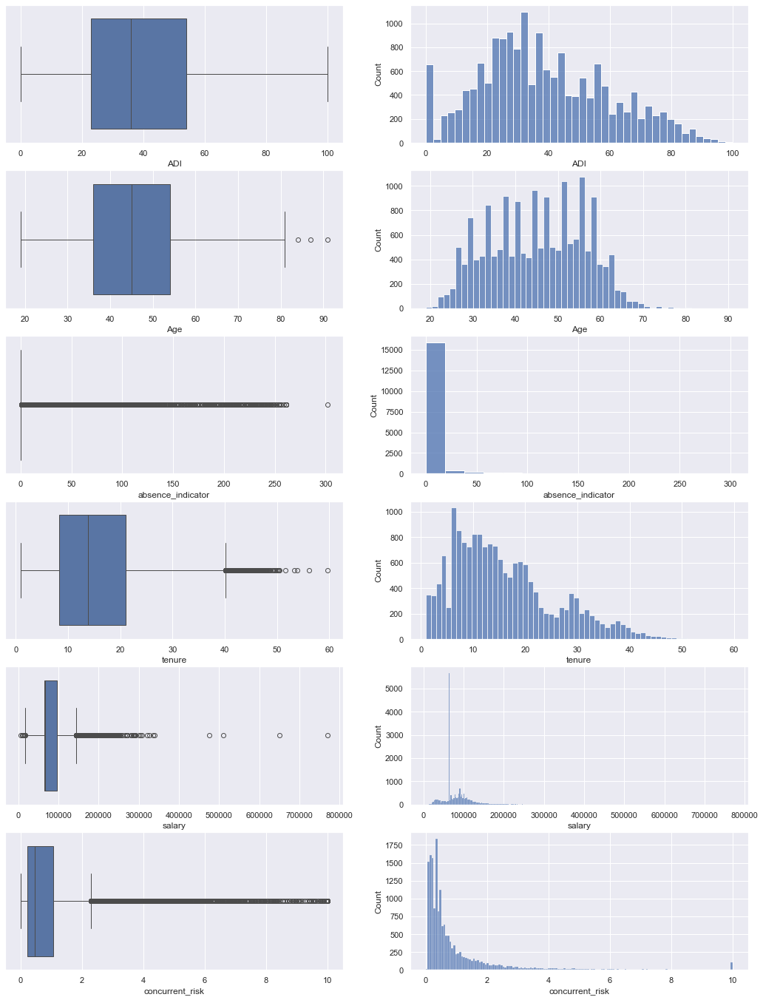

In [17]:
f, axes = plt.subplots(6, 2, figsize=(18, 24))
# font_size = 30

count = 0
for var in df_2018_numeric.iloc[:, :6]:
    sb.boxplot(df_2018_numeric.iloc[:, :6][var], orient = "h", ax = axes[count,0])
    # axes[count, 0].tick_params(axis='both', which='major', labelsize=font_size)
    sb.histplot(df_2018_numeric.iloc[:, :6][var], ax = axes[count,1])
    # axes[count, 1].tick_params(axis='both', which='major', labelsize=font_size)
    count += 1

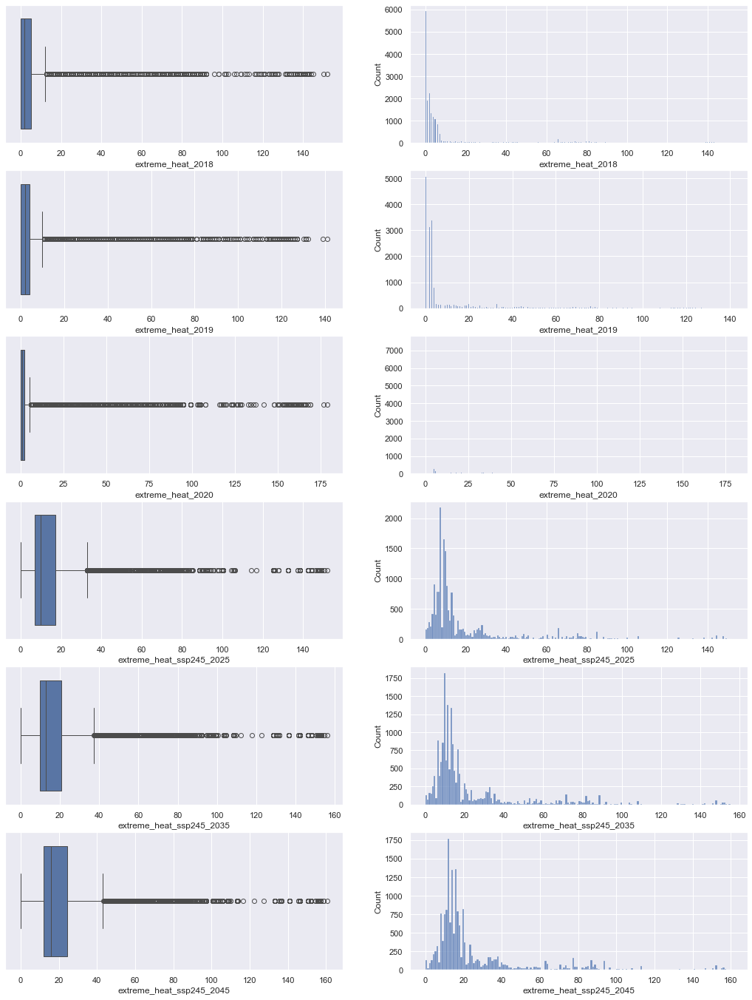

In [18]:
f, axes = plt.subplots(6, 2, figsize=(18, 24))
# font_size = 30

count = 0
for var in df_2018_numeric.iloc[:, 6:12]:
    sb.boxplot(df_2018_numeric.iloc[:, 6:12][var], orient = "h", ax = axes[count,0])
    # axes[count, 0].tick_params(axis='both', which='major', labelsize=font_size)
    sb.histplot(df_2018_numeric.iloc[:, 6:12][var], ax = axes[count,1])
    # axes[count, 1].tick_params(axis='both', which='major', labelsize=font_size)
    count += 1

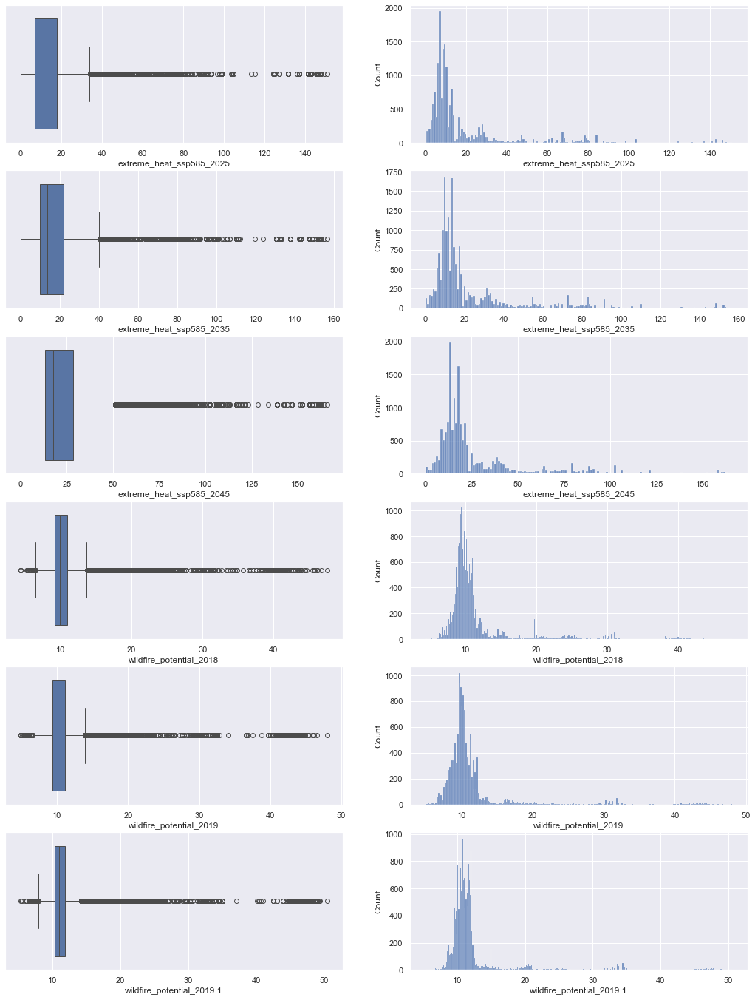

In [19]:
f, axes = plt.subplots(6, 2, figsize=(18, 24))
# font_size = 30

count = 0
for var in df_2018_numeric.iloc[:, 12:18]:
    sb.boxplot(df_2018_numeric.iloc[:, 12:18][var], orient = "h", ax = axes[count,0])
    # axes[count, 0].tick_params(axis='both', which='major', labelsize=font_size)
    sb.histplot(df_2018_numeric.iloc[:, 12:18][var], ax = axes[count,1])
    # axes[count, 1].tick_params(axis='both', which='major', labelsize=font_size)
    count += 1

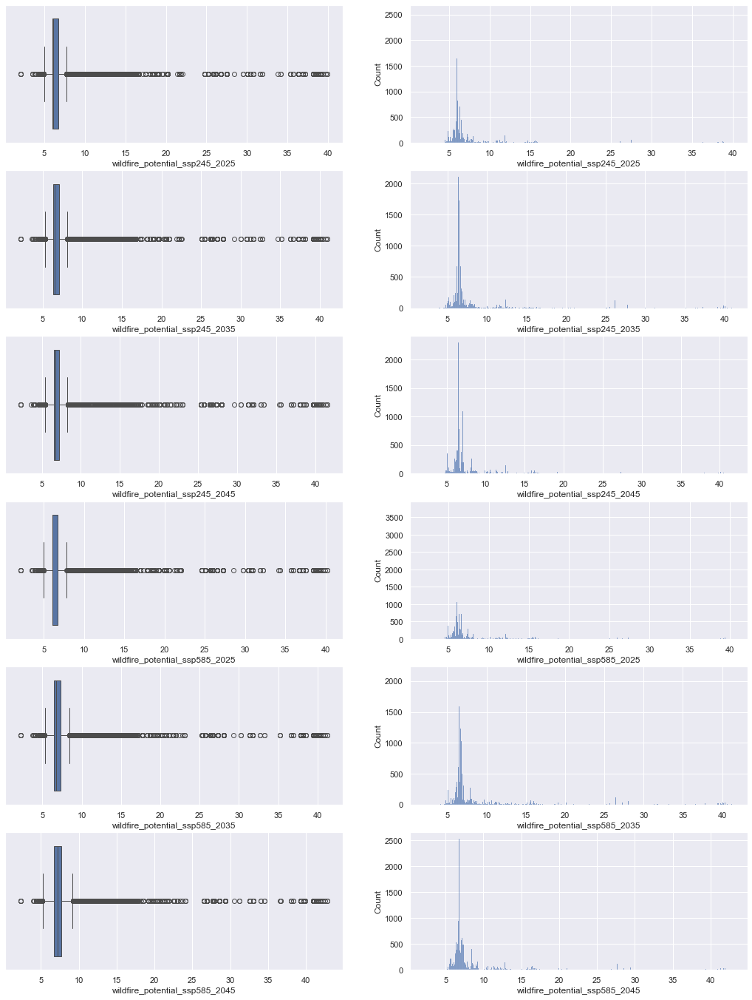

In [20]:
f, axes = plt.subplots(6, 2, figsize=(18, 24))
# font_size = 30

count = 0
for var in df_2018_numeric.iloc[:, 18:24]:
    sb.boxplot(df_2018_numeric.iloc[:, 18:24][var], orient = "h", ax = axes[count,0])
    # axes[count, 0].tick_params(axis='both', which='major', labelsize=font_size)
    sb.histplot(df_2018_numeric.iloc[:, 18:24][var], ax = axes[count,1])
    # axes[count, 1].tick_params(axis='both', which='major', labelsize=font_size)
    count += 1

In [21]:
# f, axes = plt.subplots(24, 2, figsize=(64, 256))
# font_size = 30

# count = 0
# for var in df_2018_numeric:
#     sb.boxplot(df_2018_numeric[var], orient = "h", ax = axes[count,0])
#     axes[count, 0].tick_params(axis='both', which='major', labelsize=font_size)
#     sb.histplot(df_2018_numeric[var], ax = axes[count,1])
#     axes[count, 1].tick_params(axis='both', which='major', labelsize=font_size)
#     count += 1

<AxesSubplot:>

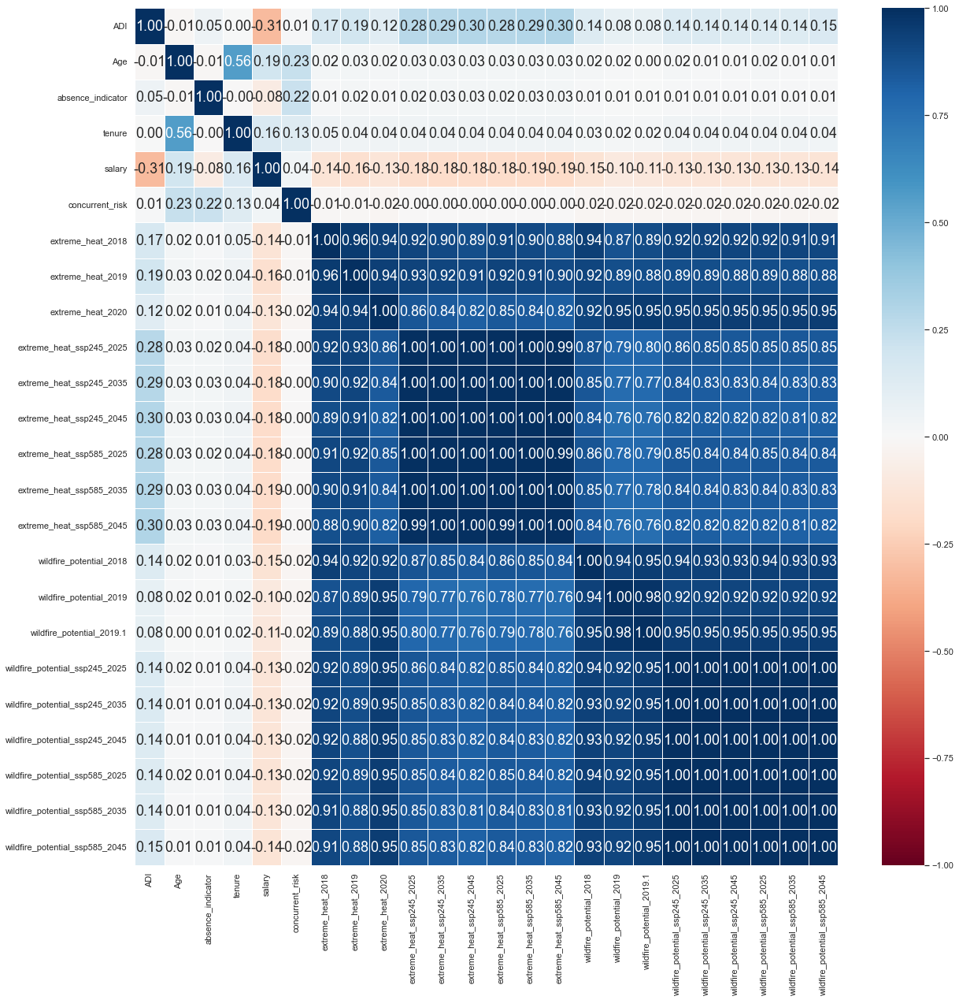

In [23]:
df_2018_numeric.corr()

f, axes = plt.subplots(1, 1, figsize=(20, 20))
sb.heatmap(df_2018_numeric.corr(), vmin = -1, vmax = 1, linewidths = 1,
           annot = True, fmt = ".2f", annot_kws = {"size": 18}, cmap = "RdBu")

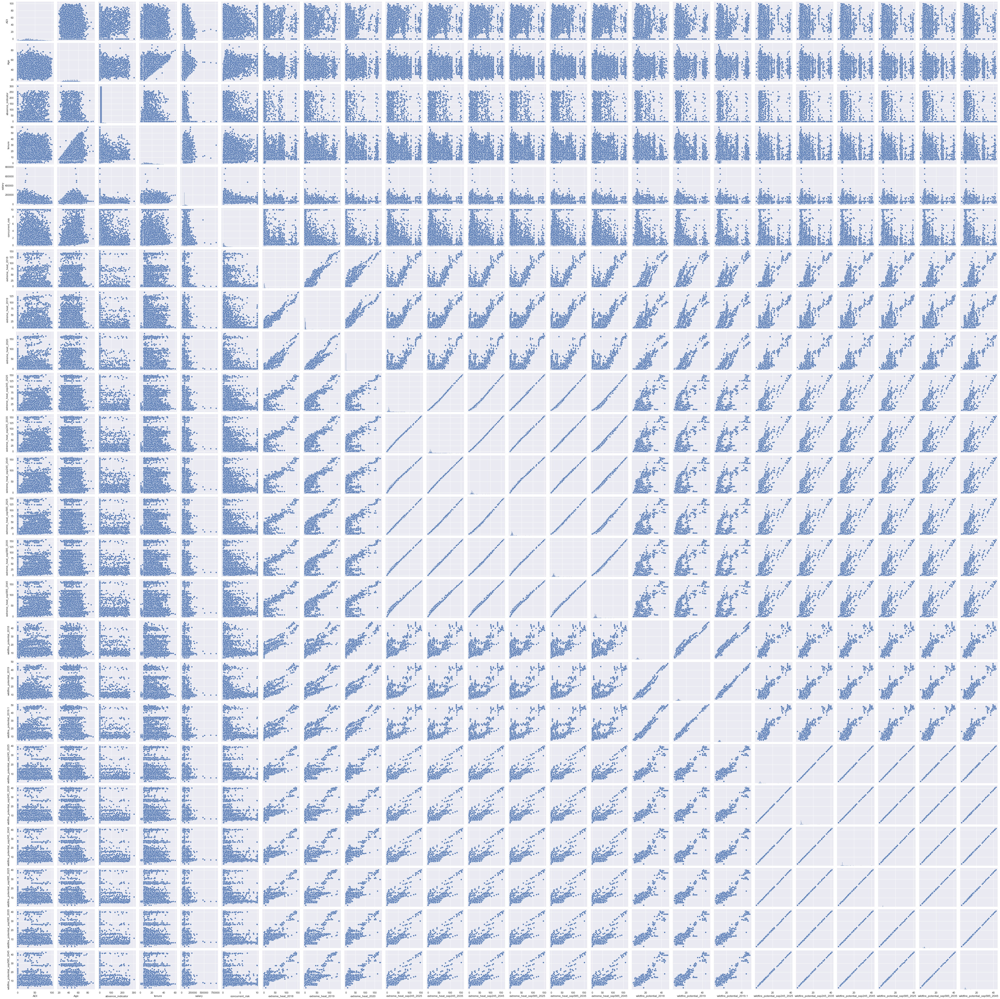

In [24]:
sb.pairplot(data = df_2018_numeric)

### Uni-Variate Analysis (categorical variables)

In [25]:
categorical_data = []

for column in df_2018.columns:
    if column not in numeric_data:
        categorical_data.append(column)
        
print(categorical_data)

['overtime', 'performance_rating', 'BiometricScreeningParticipants', 'HRQParticipants', 'lsbio_cholesterol', 'lsbio_glucose', 'lsbio_bp', 'lsbio_weight', 'lsbio_trig', 'lshrq_physact', 'lshrq_tobacco', 'lshrq_nutrition', 'lshrq_stress', 'lshrq_genHealth', 'lshrq_wellbeing', 'lshrq_alcohol', 'lshrq_sleeping', 'cc_RespiratorySinusAllergy_chronic', 'cc_diabetes', 'cc_cancer', 'cc_mskChronic', 'cc_cholesterol', 'cc_cardiac', 'cc_depression', 'cc_obesity', 'cc_mskAllOther', 'cc_behavioralAllOther', 'cc_ckd', 'rx_nonClaimant', 'rx_nonCompliant', 'prog_1', 'prog_2', 'prog_3', 'prog_4', 'prog_5', 'prog_6', 'prog_7', 'prog_8', 'prog_9', 'prog_10', 'prog_11', 'prog_12', 'prog_13', 'prog_14', 'prog_15', 'prog_16', 'Gender_Female', 'Gender_Male', 'Subgroup_Indoor', 'Subgroup_Outdoor']


In [27]:
df_2018_categorical = pd.DataFrame(df_2018[categorical_data])
df_2018_categorical.head()

,overtime,performance_rating,BiometricScreeningParticipants,HRQParticipants,lsbio_cholesterol,lsbio_glucose,lsbio_bp,lsbio_weight,lsbio_trig,lshrq_physact,...,prog_11,prog_12,prog_13,prog_14,prog_15,prog_16,Gender_Female,Gender_Male,Subgroup_Indoor,Subgroup_Outdoor
0,1,3,0,0,0,0,0,0,0,0,...,1,0,0,0,-1,-1,0,1,0,1
1,7,3,1,1,1,0,0,0,0,0,...,1,0,0,1,-1,-1,0,1,0,1
2,1,3,1,0,0,0,1,1,0,0,...,1,0,0,0,-1,-1,0,1,0,1
3,1,3,0,0,0,0,0,0,0,0,...,1,0,0,0,-1,-1,0,1,0,1
4,7,3,1,0,1,1,0,1,0,0,...,1,0,0,0,-1,-1,0,1,0,1


/Users/willisthebeast/opt/anaconda3/lib/python3.9/site-packages/seaborn/axisgrid.py:453: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)


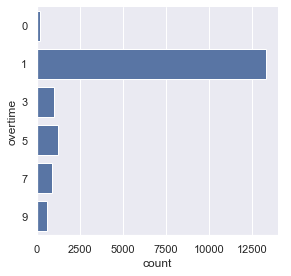

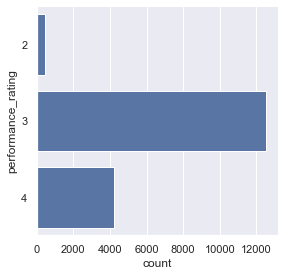

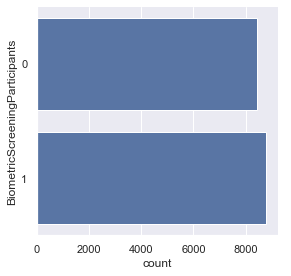

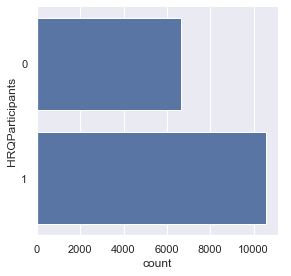

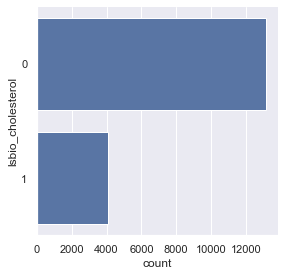

...

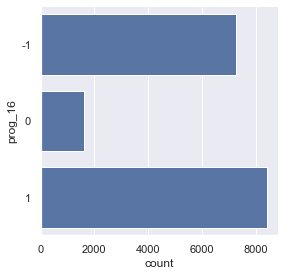

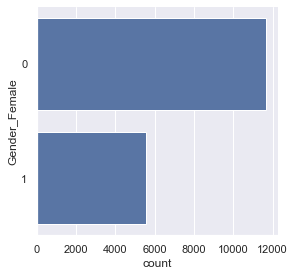

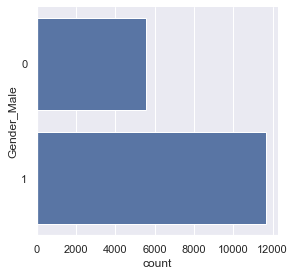

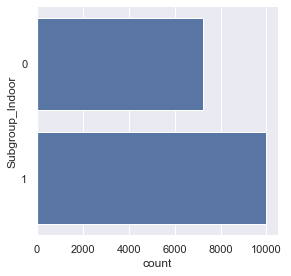

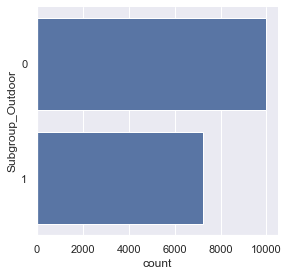

In [29]:
for column in df_2018_categorical:
    sb.catplot(y = column, data = df_2018_categorical, kind = "count", height = 4)

### Possible Multi-Variate Analysis

#### ADI to the different environmental factors

In [117]:
environmental_factors = ['ADI', 'extreme_heat_2018', 'extreme_heat_2019', 'extreme_heat_2020', 'extreme_heat_ssp245_2025', 
                         'extreme_heat_ssp245_2035', 'extreme_heat_ssp245_2045', 'extreme_heat_ssp585_2025', 'extreme_heat_ssp585_2035', 
                         'extreme_heat_ssp585_2045', 'wildfire_potential_2018', 'wildfire_potential_2019', 'wildfire_potential_2019.1', 
                         'wildfire_potential_ssp245_2025', 'wildfire_potential_ssp245_2035', 'wildfire_potential_ssp245_2045', 
                         'wildfire_potential_ssp585_2025', 'wildfire_potential_ssp585_2035', 'wildfire_potential_ssp585_2045']

df_2018_environment=pd.DataFrame(df_2018[environmental_factors])

df_2018_environment.head()

,ADI,extreme_heat_2018,extreme_heat_2019,extreme_heat_2020,extreme_heat_ssp245_2025,extreme_heat_ssp245_2035,extreme_heat_ssp245_2045,extreme_heat_ssp585_2025,extreme_heat_ssp585_2035,extreme_heat_ssp585_2045,wildfire_potential_2018,wildfire_potential_2019,wildfire_potential_2019.1,wildfire_potential_ssp245_2025,wildfire_potential_ssp245_2035,wildfire_potential_ssp245_2045,wildfire_potential_ssp585_2025,wildfire_potential_ssp585_2035,wildfire_potential_ssp585_2045
0,28,2,3,1,7.134199,9.770563,12.025974,6.961039,9.874459,13.380953,10.975000,11.460870,12.070652,6.033403,6.347014,6.512159,6.093082,6.504460,6.743331
1,18,4,4,2,7.134199,9.770563,12.025974,6.961039,9.874459,13.380953,11.141304,11.520652,11.871739,6.033403,6.347014,6.512159,6.093082,6.504460,6.743331
2,15,2,3,1,8.718615,11.632034,14.125541,8.536797,11.822511,15.597403,10.393478,10.777174,11.659783,6.064177,6.380910,6.548825,6.117186,6.522880,6.771772
3,36,1,2,0,6.393940,8.874459,11.077922,6.199134,8.930736,12.290043,11.039130,11.023913,11.963043,6.069724,6.365864,6.512409,6.091926,6.469195,6.700504
4,49,5,4,2,6.393940,8.874459,11.077922,6.199134,8.930736,12.290043,10.760870,11.308696,12.006522,6.069724,6.365864,6.512409,6.091926,6.469195,6.700504


In [40]:
print("Number of ADI :", len(df_2018_environment["ADI"].unique()))

mean_by_ADI_2018 = df_2018_environment.groupby(df_2018_environment['ADI']).mean().reset_index()

mean_by_ADI_2018

Number of ADI : 101


,ADI,extreme_heat_2018,extreme_heat_2019,extreme_heat_2020,extreme_heat_ssp245_2025,extreme_heat_ssp245_2035,extreme_heat_ssp245_2045,extreme_heat_ssp585_2025,extreme_heat_ssp585_2035,extreme_heat_ssp585_2045,wildfire_potential_2018,wildfire_potential_2019,wildfire_potential_2019.1,wildfire_potential_ssp245_2025,wildfire_potential_ssp245_2035,wildfire_potential_ssp245_2045,wildfire_potential_ssp585_2025,wildfire_potential_ssp585_2035,wildfire_potential_ssp585_2045
0,0,14.381847,14.536776,13.488263,25.818229,29.685954,32.993212,26.202047,30.436999,35.972712,12.918766,12.077756,13.554127,8.884920,9.261922,9.463082,8.949113,9.406836,9.970088
1,1,0.800000,2.600000,5.000000,0.960173,1.408658,1.882251,0.968831,1.521212,2.240693,10.352391,9.436739,10.176957,9.351744,9.518563,9.666423,9.384777,9.574236,9.843702
2,2,1.187500,3.437500,5.562500,2.962662,4.133387,5.126894,2.932630,4.249459,5.794102,9.943071,10.231318,11.463247,7.120387,7.329568,7.487132,7.125469,7.428596,7.633369
3,3,4.166667,5.500000,7.333333,2.489177,3.662338,4.775613,2.493506,3.844156,5.468975,12.174275,11.594022,12.731703,8.420775,8.654904,8.820051,8.458762,8.761186,9.037102
4,4,3.400000,3.400000,3.640000,6.461299,7.972294,9.466667,6.549264,8.248138,10.290563,10.464870,9.906261,10.912043,7.486728,7.731851,7.894907,7.534557,7.847657,8.119462
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,96,0.428571,3.714286,0.142857,9.695733,12.343846,14.411256,9.891156,13.104514,16.893012,9.294099,9.200466,10.676708,6.545959,6.972568,7.147678,6.613379,7.132656,7.637945
97,97,35.333333,42.333333,34.333333,43.314575,46.881674,49.509379,42.919193,47.738815,53.304475,13.487681,13.376087,13.858696,8.960927,9.400332,9.516865,8.910100,9.494659,10.022374
98,98,0.000000,1.000000,0.000000,5.519480,7.917749,9.969697,5.761905,8.796536,12.108225,9.666667,9.572826,12.102536,7.869479,8.473486,8.789359,7.993296,8.636140,9.181459
99,99,2.000000,20.000000,14.500000,47.103896,54.917749,60.530305,47.714287,55.227273,66.465368,11.346196,11.269022,11.721196,7.307325,7.499644,7.572327,7.126324,7.314557,7.921905


In [41]:
highest_mean_by_ADI_2018=mean_by_ADI_2018.idxmax()

highest_mean_by_ADI_2018

ADI                               100
extreme_heat_2018                  88
extreme_heat_2019                  88
extreme_heat_2020                  88
extreme_heat_ssp245_2025           88
extreme_heat_ssp245_2035           88
extreme_heat_ssp245_2045           88
extreme_heat_ssp585_2025           88
extreme_heat_ssp585_2035           88
extreme_heat_ssp585_2045           88
wildfire_potential_2018            88
wildfire_potential_2019            88
wildfire_potential_2019.1          88
wildfire_potential_ssp245_2025     88
wildfire_potential_ssp245_2035     88
wildfire_potential_ssp245_2045     88
wildfire_potential_ssp585_2025     88
wildfire_potential_ssp585_2035     88
wildfire_potential_ssp585_2045     88
dtype: int64

In [57]:
top3_mean_by_ADI = {}

for column in mean_by_ADI_2018.columns:
    if column == 'ADI':
        continue
    else:
        top3_mean_by_ADI[column] = mean_by_ADI_2018.nlargest(3, column).ADI.tolist()
        
top3_mean_by_ADI

{'extreme_heat_2018': [88, 89, 77],
 'extreme_heat_2019': [88, 89, 97],
 'extreme_heat_2020': [88, 89, 76],
 'extreme_heat_ssp245_2025': [88, 89, 76],
 'extreme_heat_ssp245_2035': [88, 89, 76],
 'extreme_heat_ssp245_2045': [88, 89, 77],
 'extreme_heat_ssp585_2025': [88, 89, 76],
 'extreme_heat_ssp585_2035': [88, 89, 76],
 'extreme_heat_ssp585_2045': [88, 89, 76],
 'wildfire_potential_2018': [88, 89, 76],
 'wildfire_potential_2019': [88, 89, 76],
 'wildfire_potential_2019.1': [88, 89, 76],
 'wildfire_potential_ssp245_2025': [88, 89, 76],
 'wildfire_potential_ssp245_2035': [88, 89, 76],
 'wildfire_potential_ssp245_2045': [88, 89, 76],
 'wildfire_potential_ssp585_2025': [88, 89, 76],
 'wildfire_potential_ssp585_2035': [88, 89, 76],
 'wildfire_potential_ssp585_2045': [88, 89, 76]}

In [85]:
from collections import Counter

most_common_value = Counter()

for value in top3_mean_by_ADI.values():
    count = Counter(value)
    most_common_value += count

print(most_common_value)

Counter({88: 18, 89: 18, 76: 15, 77: 2, 97: 1})


ADI 88, 89 and 76 have the worst environmental factors.

##### ADI = 88, 89, 76

In [91]:
df_2018_worst_environment=df_2018_environment.loc[(df_2018_environment.ADI==88) | 
                                                  (df_2018_environment.ADI==89) | 
                                                  (df_2018_environment.ADI==76)].reset_index(drop=True)

df_2018_worst_environment.head()

,ADI,extreme_heat_2018,extreme_heat_2019,extreme_heat_2020,extreme_heat_ssp245_2025,extreme_heat_ssp245_2035,extreme_heat_ssp245_2045,extreme_heat_ssp585_2025,extreme_heat_ssp585_2035,extreme_heat_ssp585_2045,wildfire_potential_2018,wildfire_potential_2019,wildfire_potential_2019.1,wildfire_potential_ssp245_2025,wildfire_potential_ssp245_2035,wildfire_potential_ssp245_2045,wildfire_potential_ssp585_2025,wildfire_potential_ssp585_2035,wildfire_potential_ssp585_2045
0,89,6,4,5,13.112555,16.419914,19.567100,13.285714,17.238094,21.593073,10.409783,10.848913,11.110870,6.566475,6.882546,7.078842,6.570887,7.018056,7.308116
1,89,6,4,5,13.112555,16.419914,19.567100,13.285714,17.238094,21.593073,10.409783,10.848913,11.110870,6.566475,6.882546,7.078842,6.570887,7.018056,7.308116
2,88,7,3,1,13.112555,16.419914,19.567100,13.285714,17.238094,21.593073,11.529348,11.567391,11.475000,6.566475,6.882546,7.078842,6.570887,7.018056,7.308116
3,89,0,0,0,4.930736,6.670996,8.229437,5.060606,7.255411,9.268398,7.961957,7.683696,8.523913,5.541407,5.861491,6.084256,5.680689,6.208684,6.527939
4,88,89,87,104,105.779220,108.398270,113.467530,103.805200,110.069270,121.476190,31.460870,32.383696,34.620652,27.504528,27.796019,28.064533,27.325233,28.058224,29.364147


<AxesSubplot:>

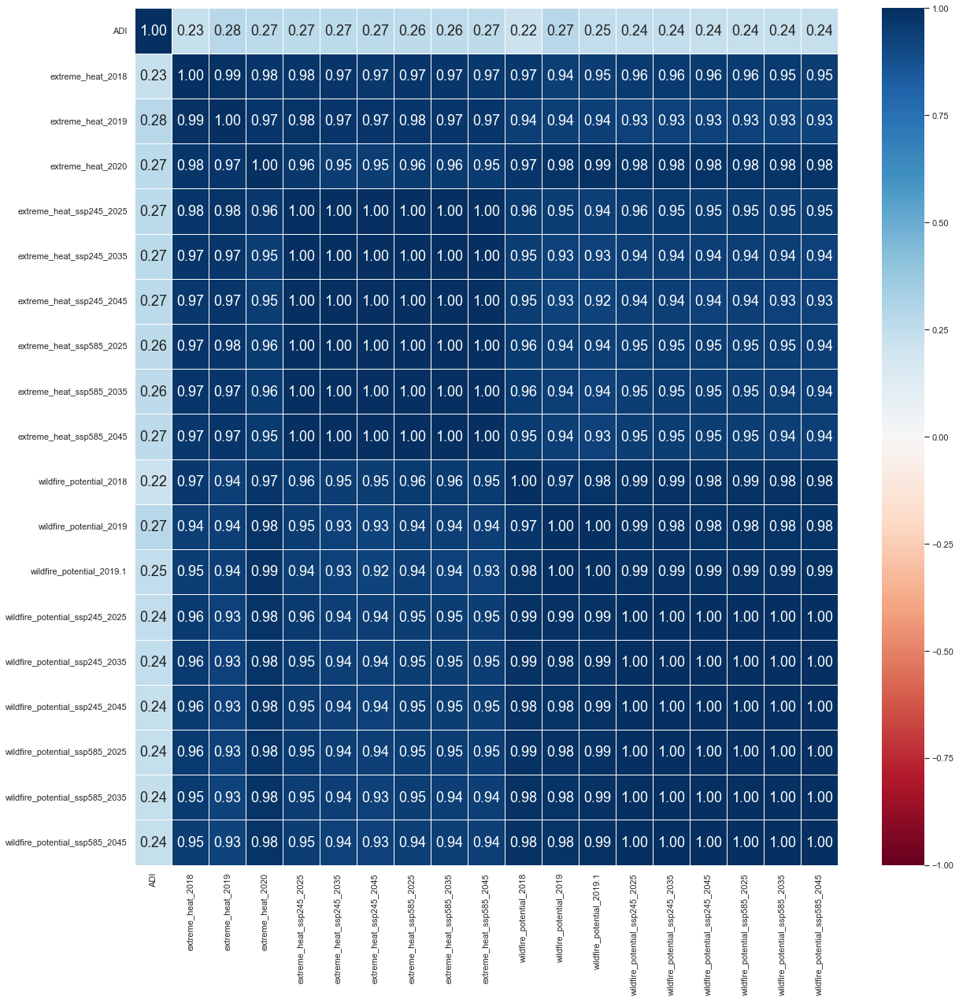

In [93]:
df_2018_worst_environment.corr()

f, axes = plt.subplots(1, 1, figsize=(20, 20))
sb.heatmap(df_2018_worst_environment.corr(), vmin = -1, vmax = 1, linewidths = 1,
           annot = True, fmt = ".2f", annot_kws = {"size": 18}, cmap = "RdBu")

Environmental factors are dependent of each other as can be seen by its linearity

In [130]:
# attempt feature selection or PCA

#### ADI to Employee's Health

In [118]:
health_factors = ['ADI', 'BiometricScreeningParticipants', 'HRQParticipants', 'lsbio_cholesterol', 'lsbio_glucose', 
                  'lsbio_bp', 'lsbio_weight', 'lsbio_trig', 'lshrq_physact', 'lshrq_tobacco', 'lshrq_nutrition', 'lshrq_stress', 
                  'lshrq_genHealth', 'lshrq_wellbeing', 'lshrq_alcohol', 'lshrq_sleeping', 'cc_RespiratorySinusAllergy_chronic', 
                  'cc_diabetes', 'cc_cancer', 'cc_mskChronic', 'cc_cholesterol', 'cc_cardiac', 'cc_depression', 'cc_obesity', 
                  'cc_mskAllOther', 'cc_behavioralAllOther', 'cc_ckd', 'rx_nonClaimant', 'rx_nonCompliant']

df_2018_health=pd.DataFrame(df_2018[health_factors])

df_2018_health.head()

,ADI,BiometricScreeningParticipants,HRQParticipants,lsbio_cholesterol,lsbio_glucose,lsbio_bp,lsbio_weight,lsbio_trig,lshrq_physact,lshrq_tobacco,...,cc_mskChronic,cc_cholesterol,cc_cardiac,cc_depression,cc_obesity,cc_mskAllOther,cc_behavioralAllOther,cc_ckd,rx_nonClaimant,rx_nonCompliant
0,28,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1,18,1,1,1,0,0,0,0,0,0,...,1,0,0,1,0,0,0,0,1,0
2,15,1,0,0,0,1,1,0,0,0,...,0,1,0,0,0,0,0,0,1,0
3,36,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,1,0
4,49,1,0,1,1,0,1,0,0,0,...,0,0,0,0,1,0,0,0,1,0


In [109]:
# # count_by_ADI_2018 = df_2018_health.groupby('ADI')

count_by_ADI_2018 = pd.DataFrame(
    pd.melt(df_2018_health, id_vars=['ADI'])
    .pivot_table(columns=['variable', 'value'], aggfunc='size', index='ADI', fill_value=0)
)

count_by_ADI_2018.columns = count_by_ADI_2018.columns.map('{0[0]}_{0[1]}'.format)

count_by_ADI_2018.reset_index(inplace=True)

count_by_ADI_2018.head()

,ADI,BiometricScreeningParticipants_0,BiometricScreeningParticipants_1,HRQParticipants_0,HRQParticipants_1,cc_RespiratorySinusAllergy_chronic_0,cc_RespiratorySinusAllergy_chronic_1,cc_behavioralAllOther_0,cc_behavioralAllOther_1,cc_cancer_0,...,lshrq_stress_0,lshrq_stress_1,lshrq_tobacco_0,lshrq_tobacco_1,lshrq_wellbeing_0,lshrq_wellbeing_1,rx_nonClaimant_0,rx_nonClaimant_1,rx_nonCompliant_0,rx_nonCompliant_1
0,0,147,492,147,492,575,64,574,65,623,...,333,306,622,17,521,118,148,491,588,51
1,1,0,5,0,5,4,1,4,1,5,...,1,4,5,0,3,2,1,4,5,0
2,2,3,13,3,13,16,0,16,0,16,...,10,6,16,0,16,0,0,16,16,0
3,3,2,4,3,3,5,1,5,1,6,...,3,3,6,0,5,1,0,6,6,0
4,4,12,13,12,13,21,4,22,3,24,...,18,7,24,1,22,3,5,20,24,1


In [110]:
highest_count_by_ADI_2018=count_by_ADI_2018.idxmax()

highest_count_by_ADI_2018

ADI                                     100
BiometricScreeningParticipants_0         22
BiometricScreeningParticipants_1          0
HRQParticipants_0                        22
HRQParticipants_1                         0
cc_RespiratorySinusAllergy_chronic_0      0
cc_RespiratorySinusAllergy_chronic_1      0
cc_behavioralAllOther_0                   0
cc_behavioralAllOther_1                  22
cc_cancer_0                               0
cc_cancer_1                              22
cc_cardiac_0                              0
cc_cardiac_1                              0
cc_cholesterol_0                          0
cc_cholesterol_1                         22
cc_ckd_0                                  0
cc_ckd_1                                 30
cc_depression_0                           0
cc_depression_1                           0
cc_diabetes_0                             0
cc_diabetes_1                             0
cc_mskAllOther_0                          0
cc_mskAllOther_1                

In [111]:
top3_0_count_by_ADI = {}
top3_1_count_by_ADI = {}

for column in count_by_ADI_2018.columns:
    if column == 'ADI':
        continue
    else:
        if column[-1] == '1':
            top3_1_count_by_ADI[column] = count_by_ADI_2018.nlargest(3, column).ADI.tolist()
        if column[-1] == '0':
            top3_0_count_by_ADI[column] = count_by_ADI_2018.nlargest(3, column).ADI.tolist()

print("Top 3 with 0: ", top3_0_count_by_ADI)
print()
print("Top 3 with 1: ", top3_1_count_by_ADI)

Top 3 with 0:  {'BiometricScreeningParticipants_0': [22, 27, 29], 'HRQParticipants_0': [22, 27, 21], 'cc_RespiratorySinusAllergy_chronic_0': [0, 27, 22], 'cc_behavioralAllOther_0': [0, 22, 27], 'cc_cancer_0': [0, 22, 27], 'cc_cardiac_0': [0, 22, 27], 'cc_cholesterol_0': [0, 22, 27], 'cc_ckd_0': [0, 22, 27], 'cc_depression_0': [0, 27, 22], 'cc_diabetes_0': [0, 22, 27], 'cc_mskAllOther_0': [0, 22, 27], 'cc_mskChronic_0': [0, 27, 22], 'cc_obesity_0': [22, 27, 0], 'lsbio_bp_0': [22, 27, 29], 'lsbio_cholesterol_0': [22, 27, 0], 'lsbio_glucose_0': [0, 22, 27], 'lsbio_trig_0': [0, 22, 27], 'lsbio_weight_0': [22, 27, 29], 'lshrq_alcohol_0': [0, 27, 22], 'lshrq_genHealth_0': [0, 22, 27], 'lshrq_nutrition_0': [22, 27, 29], 'lshrq_physact_0': [0, 22, 27], 'lshrq_sleeping_0': [22, 27, 29], 'lshrq_stress_0': [22, 27, 29], 'lshrq_tobacco_0': [0, 22, 27], 'lshrq_wellbeing_0': [0, 22, 27], 'rx_nonClaimant_0': [0, 22, 27], 'rx_nonCompliant_0': [0, 22, 27]}

Top 3 with 1:  {'BiometricScreeningParticipan

In [112]:
# change to percentage

from collections import Counter

most_common_value_1 = Counter()
most_common_value_0 = Counter()

for value in top3_0_count_by_ADI.values():
    count = Counter(value)
    most_common_value_0 += count
    
for value in top3_1_count_by_ADI.values():
    count = Counter(value)
    most_common_value_1 += count

print(most_common_value_0)
print(most_common_value_1)

Counter({22: 28, 27: 28, 0: 21, 29: 6, 21: 1})
Counter({27: 24, 0: 23, 22: 16, 38: 8, 29: 6, 30: 1, 34: 1, 36: 1, 40: 1, 21: 1, 28: 1, 32: 1})


#### Employee's Health to Environmental factors

In [119]:
health_factors.pop(0) # remove ADI
environmental_factors.pop(0) # remove ADI

health_environmental_factors = health_factors+environmental_factors

df_2018_health_environmental=pd.DataFrame(df_2018[health_environmental_factors])

df_2018_health_environmental.head()

,BiometricScreeningParticipants,HRQParticipants,lsbio_cholesterol,lsbio_glucose,lsbio_bp,lsbio_weight,lsbio_trig,lshrq_physact,lshrq_tobacco,lshrq_nutrition,...,extreme_heat_ssp585_2045,wildfire_potential_2018,wildfire_potential_2019,wildfire_potential_2019.1,wildfire_potential_ssp245_2025,wildfire_potential_ssp245_2035,wildfire_potential_ssp245_2045,wildfire_potential_ssp585_2025,wildfire_potential_ssp585_2035,wildfire_potential_ssp585_2045
0,0,0,0,0,0,0,0,0,0,0,...,13.380953,10.975000,11.460870,12.070652,6.033403,6.347014,6.512159,6.093082,6.504460,6.743331
1,1,1,1,0,0,0,0,0,0,0,...,13.380953,11.141304,11.520652,11.871739,6.033403,6.347014,6.512159,6.093082,6.504460,6.743331
2,1,0,0,0,1,1,0,0,0,0,...,15.597403,10.393478,10.777174,11.659783,6.064177,6.380910,6.548825,6.117186,6.522880,6.771772
3,0,0,0,0,0,0,0,0,0,0,...,12.290043,11.039130,11.023913,11.963043,6.069724,6.365864,6.512409,6.091926,6.469195,6.700504
4,1,0,1,1,0,1,0,0,0,0,...,12.290043,10.760870,11.308696,12.006522,6.069724,6.365864,6.512409,6.091926,6.469195,6.700504


In [120]:
# removing all the non biometric screening and HRQ participants

df_2018_health_environmental = df_2018_health_environmental[(df_2018_health_environmental['BiometricScreeningParticipants'] != 0) &
                                                            (df_2018_health_environmental['HRQParticipants'] != 0)].reset_index(drop=True)

df_2018_health_environmental.head()

,BiometricScreeningParticipants,HRQParticipants,lsbio_cholesterol,lsbio_glucose,lsbio_bp,lsbio_weight,lsbio_trig,lshrq_physact,lshrq_tobacco,lshrq_nutrition,...,extreme_heat_ssp585_2045,wildfire_potential_2018,wildfire_potential_2019,wildfire_potential_2019.1,wildfire_potential_ssp245_2025,wildfire_potential_ssp245_2035,wildfire_potential_ssp245_2045,wildfire_potential_ssp585_2025,wildfire_potential_ssp585_2035,wildfire_potential_ssp585_2045
0,1,1,1,0,0,0,0,0,0,0,...,13.380953,11.141304,11.520652,11.871739,6.033403,6.347014,6.512159,6.093082,6.504460,6.743331
1,1,1,1,0,1,1,0,1,0,0,...,14.064935,10.722826,10.214130,10.913043,6.076034,6.377780,6.529870,6.091510,6.460996,6.703535
2,1,1,0,0,0,1,0,0,0,0,...,13.380953,11.095652,11.556522,12.109783,6.033403,6.347014,6.512159,6.093082,6.504460,6.743331
3,1,1,0,0,1,1,0,1,0,1,...,22.619047,9.092391,10.085870,9.659783,6.601501,6.901109,7.083837,6.614857,7.057394,7.349958
4,1,1,1,0,1,1,1,1,0,1,...,4.757576,8.216304,9.267391,10.252174,5.396209,5.679896,5.818335,5.464716,5.817056,6.011631


In [121]:
df_2018_health_environmental = df_2018_health_environmental.drop(columns=['BiometricScreeningParticipants', 'HRQParticipants'])

df_2018_health_environmental.head()

,lsbio_cholesterol,lsbio_glucose,lsbio_bp,lsbio_weight,lsbio_trig,lshrq_physact,lshrq_tobacco,lshrq_nutrition,lshrq_stress,lshrq_genHealth,...,extreme_heat_ssp585_2045,wildfire_potential_2018,wildfire_potential_2019,wildfire_potential_2019.1,wildfire_potential_ssp245_2025,wildfire_potential_ssp245_2035,wildfire_potential_ssp245_2045,wildfire_potential_ssp585_2025,wildfire_potential_ssp585_2035,wildfire_potential_ssp585_2045
0,1,0,0,0,0,0,0,0,0,0,...,13.380953,11.141304,11.520652,11.871739,6.033403,6.347014,6.512159,6.093082,6.504460,6.743331
1,1,0,1,1,0,1,0,0,1,1,...,14.064935,10.722826,10.214130,10.913043,6.076034,6.377780,6.529870,6.091510,6.460996,6.703535
2,0,0,0,1,0,0,0,0,0,0,...,13.380953,11.095652,11.556522,12.109783,6.033403,6.347014,6.512159,6.093082,6.504460,6.743331
3,0,0,1,1,0,1,0,1,0,0,...,22.619047,9.092391,10.085870,9.659783,6.601501,6.901109,7.083837,6.614857,7.057394,7.349958
4,1,0,1,1,1,1,0,1,0,0,...,4.757576,8.216304,9.267391,10.252174,5.396209,5.679896,5.818335,5.464716,5.817056,6.011631


<AxesSubplot:>

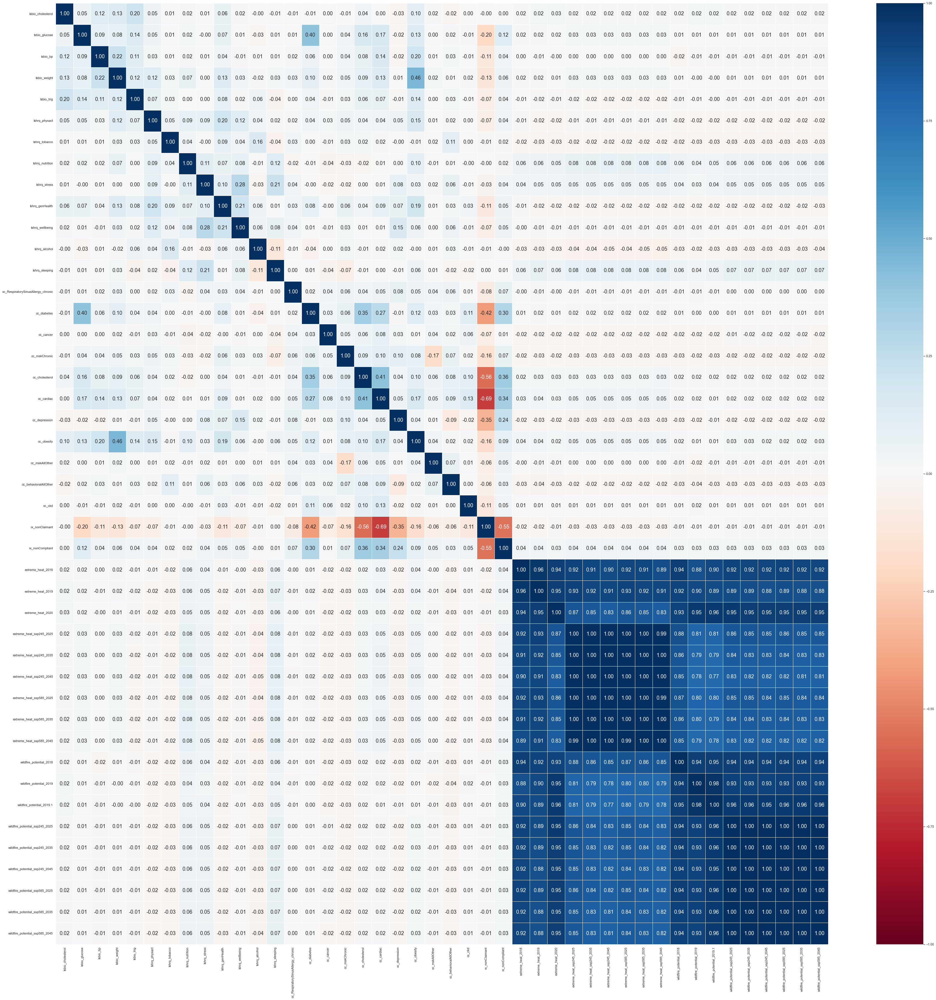

In [125]:
f, axes = plt.subplots(1, 1, figsize=(60, 60))
sb.heatmap(df_2018_health_environmental.corr(), vmin = -1, vmax = 1, linewidths = 1,
           annot = True, fmt = ".2f", annot_kws = {"size": 18}, cmap = "RdBu")

In [124]:
df_2018_health_environmental.corr()

,lsbio_cholesterol,lsbio_glucose,lsbio_bp,lsbio_weight,lsbio_trig,lshrq_physact,lshrq_tobacco,lshrq_nutrition,lshrq_stress,lshrq_genHealth,...,extreme_heat_ssp585_2045,wildfire_potential_2018,wildfire_potential_2019,wildfire_potential_2019.1,wildfire_potential_ssp245_2025,wildfire_potential_ssp245_2035,wildfire_potential_ssp245_2045,wildfire_potential_ssp585_2025,wildfire_potential_ssp585_2035,wildfire_potential_ssp585_2045
lsbio_cholesterol,1.000000,0.047617,0.118306,0.129252,0.203214,0.050451,0.013517,0.022235,0.006346,0.063413,...,0.019481,0.021174,0.024354,0.024522,0.022845,0.022776,0.022865,0.022857,0.023098,0.022819
lsbio_glucose,0.047617,1.000000,0.087017,0.082391,0.140413,0.047096,0.006831,0.023973,-0.000063,0.071897,...,0.027163,0.011981,0.012302,0.010247,0.014224,0.013729,0.013486,0.013977,0.013595,0.013494
lsbio_bp,0.118306,0.087017,1.000000,0.219325,0.113738,0.029681,0.014320,0.018666,0.006608,0.038775,...,0.000087,-0.017403,-0.014129,-0.008048,-0.011240,-0.010260,-0.010026,-0.011191,-0.009716,-0.008948
lsbio_weight,0.129252,0.082391,0.219325,1.000000,0.123780,0.121906,0.025156,0.074272,0.003532,0.132246,...,0.026173,0.007631,-0.000570,-0.002738,0.007234,0.006774,0.006543,0.006895,0.006514,0.006298
lsbio_trig,0.203214,0.140413,0.113738,0.123780,1.000000,0.070367,0.026583,0.003207,0.000627,0.078519,...,-0.018554,-0.009866,-0.005531,-0.003859,-0.010167,-0.009902,-0.009549,-0.010123,-0.009335,-0.009887
lshrq_physact,0.050451,0.047096,0.029681,0.121906,0.070367,1.000000,0.053483,0.093102,0.090217,0.195829,...,-0.013650,-0.019259,-0.017487,-0.020328,-0.022721,-0.022933,-0.022756,-0.023254,-0.022542,-0.022445
lshrq_tobacco,0.013517,0.006831,0.014320,0.025156,0.026583,0.053483,1.000000,0.036076,-0.003276,0.087592,...,-0.021209,-0.024963,-0.028556,-0.029509,-0.025455,-0.025818,-0.025632,-0.025276,-0.025481,-0.026382
lshrq_nutrition,0.022235,0.023973,0.018666,0.074272,0.003207,0.093102,0.036076,1.000000,0.114227,0.069399,...,0.079454,0.059968,0.041027,0.046844,0.058768,0.058390,0.058225,0.058765,0.058314,0.060237
lshrq_stress,0.006346,-0.000063,0.006608,0.003532,0.000627,0.090217,-0.003276,0.114227,1.000000,0.100164,...,0.048296,0.040848,0.025396,0.040183,0.049307,0.050103,0.050257,0.049629,0.050706,0.053597
lshrq_genHealth,0.063413,0.071897,0.038775,0.132246,0.078519,0.195829,0.087592,0.069399,0.100164,1.000000,...,-0.020707,-0.017122,-0.018000,-0.022377,-0.022664,-0.023055,-0.023058,-0.022748,-0.023390,-0.025103


#### Performance Rating to Employees Health

In [126]:
print(health_factors)

['BiometricScreeningParticipants', 'HRQParticipants', 'lsbio_cholesterol', 'lsbio_glucose', 'lsbio_bp', 'lsbio_weight', 'lsbio_trig', 'lshrq_physact', 'lshrq_tobacco', 'lshrq_nutrition', 'lshrq_stress', 'lshrq_genHealth', 'lshrq_wellbeing', 'lshrq_alcohol', 'lshrq_sleeping', 'cc_RespiratorySinusAllergy_chronic', 'cc_diabetes', 'cc_cancer', 'cc_mskChronic', 'cc_cholesterol', 'cc_cardiac', 'cc_depression', 'cc_obesity', 'cc_mskAllOther', 'cc_behavioralAllOther', 'cc_ckd', 'rx_nonClaimant', 'rx_nonCompliant']


In [131]:
# attempt Cramer's V to find relatioship between categorical data

#### Performance Rating to Environmental Factors

In [128]:
environmental_factors.insert(0, 'performance_rating')

print(environmental_factors)

['performance_rating', 'extreme_heat_2018', 'extreme_heat_2019', 'extreme_heat_2020', 'extreme_heat_ssp245_2025', 'extreme_heat_ssp245_2035', 'extreme_heat_ssp245_2045', 'extreme_heat_ssp585_2025', 'extreme_heat_ssp585_2035', 'extreme_heat_ssp585_2045', 'wildfire_potential_2018', 'wildfire_potential_2019', 'wildfire_potential_2019.1', 'wildfire_potential_ssp245_2025', 'wildfire_potential_ssp245_2035', 'wildfire_potential_ssp245_2045', 'wildfire_potential_ssp585_2025', 'wildfire_potential_ssp585_2035', 'wildfire_potential_ssp585_2045']


In [129]:
df_2018_performance_environmental=pd.DataFrame(df_2018[environmental_factors])

df_2018_performance_environmental.head()

,performance_rating,extreme_heat_2018,extreme_heat_2019,extreme_heat_2020,extreme_heat_ssp245_2025,extreme_heat_ssp245_2035,extreme_heat_ssp245_2045,extreme_heat_ssp585_2025,extreme_heat_ssp585_2035,extreme_heat_ssp585_2045,wildfire_potential_2018,wildfire_potential_2019,wildfire_potential_2019.1,wildfire_potential_ssp245_2025,wildfire_potential_ssp245_2035,wildfire_potential_ssp245_2045,wildfire_potential_ssp585_2025,wildfire_potential_ssp585_2035,wildfire_potential_ssp585_2045
0,3,2,3,1,7.134199,9.770563,12.025974,6.961039,9.874459,13.380953,10.975000,11.460870,12.070652,6.033403,6.347014,6.512159,6.093082,6.504460,6.743331
1,3,4,4,2,7.134199,9.770563,12.025974,6.961039,9.874459,13.380953,11.141304,11.520652,11.871739,6.033403,6.347014,6.512159,6.093082,6.504460,6.743331
2,3,2,3,1,8.718615,11.632034,14.125541,8.536797,11.822511,15.597403,10.393478,10.777174,11.659783,6.064177,6.380910,6.548825,6.117186,6.522880,6.771772
3,3,1,2,0,6.393940,8.874459,11.077922,6.199134,8.930736,12.290043,11.039130,11.023913,11.963043,6.069724,6.365864,6.512409,6.091926,6.469195,6.700504
4,3,5,4,2,6.393940,8.874459,11.077922,6.199134,8.930736,12.290043,10.760870,11.308696,12.006522,6.069724,6.365864,6.512409,6.091926,6.469195,6.700504


In [133]:
print("Number of Performance Rating :", len(df_2018_performance_environmental["performance_rating"].unique()))

mean_by_performance_2018 = df_2018_performance_environmental.groupby(df_2018_performance_environmental['performance_rating']).mean().reset_index()

mean_by_performance_2018

Number of Performance Rating : 3


,performance_rating,extreme_heat_2018,extreme_heat_2019,extreme_heat_2020,extreme_heat_ssp245_2025,extreme_heat_ssp245_2035,extreme_heat_ssp245_2045,extreme_heat_ssp585_2025,extreme_heat_ssp585_2035,extreme_heat_ssp585_2045,wildfire_potential_2018,wildfire_potential_2019,wildfire_potential_2019.1,wildfire_potential_ssp245_2025,wildfire_potential_ssp245_2035,wildfire_potential_ssp245_2045,wildfire_potential_ssp585_2025,wildfire_potential_ssp585_2035,wildfire_potential_ssp585_2045
0,2,9.152688,9.664516,7.294624,19.489038,23.044780,26.090053,19.799032,23.683713,28.559633,11.420547,11.097511,12.102702,7.486762,7.820554,7.993147,7.533425,7.951524,8.359729
1,3,8.439968,8.361783,6.844268,17.417335,20.759351,23.675685,17.612041,21.332625,25.964841,11.348553,11.039837,12.115606,7.461415,7.804293,7.988963,7.508945,7.946826,8.360339
2,4,10.275740,10.098935,8.617988,20.264006,23.829387,26.912455,20.571318,24.520360,29.537749,11.814128,11.237592,12.557785,7.975208,8.344147,8.540819,8.031055,8.489010,8.977957
